# MSDS 7337 - Natural Language Processing
## Homework 8 - Topic Modeling
### Evangelos Giakoumakis

Library imports

In [1]:
from __future__ import print_function
import platform
import sys
import nltk
import requests
import re
from requests import get
from itertools import repeat
from bs4 import BeautifulSoup
import pandas as pd
import numpy as np
from nltk.stem.snowball import SnowballStemmer
import matplotlib.pyplot as plt
from sklearn.decomposition import NMF, LatentDirichletAllocation, TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud, ImageColorGenerator

General system information and library versions

In [2]:
import platform; print(platform.platform())
import sys;print('Python', sys.version)
import os;print('OS', os.name)
import bs4;print('Beautiful Soup', bs4.__version__)
#import urllib;print('Urllib', urllib.request.__version__) 
import re;print('Regex', re.__version__)
import spacy;print('SpaCy', spacy.__version__)
#import gensim;print('Gensim', gensim.__version__)
import sklearn;print('Sklearn', sklearn.__version__)
import scipy;print('Scipy', scipy.__version__)
import matplotlib;print('Matplotlib', matplotlib.__version__)
print (os.environ['CONDA_DEFAULT_ENV'])

Windows-10-10.0.17134
Python 2.7.15 |Anaconda, Inc.| (default, May  1 2018, 18:37:09) [MSC v.1500 64 bit (AMD64)]
OS nt
Beautiful Soup 4.6.3
Regex 2.2.1
SpaCy 2.0.12
Sklearn 0.19.1
Scipy 1.1.0
Matplotlib 2.2.2
base


## Collection of reviews

Function to parse the first 25 reviews given a movie link

In [3]:
def movie_review_crawler(url):
    response = get(url)
    html_soup = BeautifulSoup(response.text, 'html.parser')
    rev_containers = html_soup.find_all('div', class_ = 'text show-more__control')
    reviews = []
    for rv in rev_containers:
        reviews.append(rv.text)
    return reviews

Function to create a list of 100 reviews of science fiction movies 
Films used: (Matrix, Inception, Sunshine, Dragonball)

In [4]:
def my_review_crawler():
        matrix = movie_review_crawler("https://www.imdb.com/title/tt0133093/reviews?sort=helpfulnessScore&dir=desc&ratingFilter=10")
        matrix2 = movie_review_crawler("https://www.imdb.com/title/tt0133093/reviews?sort=helpfulnessScore&dir=desc&ratingFilter=2")
        inception = movie_review_crawler("https://www.imdb.com/title/tt1375666/reviews?sort=helpfulnessScore&dir=desc&ratingFilter=10")
        inception2 = movie_review_crawler("https://www.imdb.com/title/tt1375666/reviews?sort=helpfulnessScore&dir=desc&ratingFilter=2")
        sunshine = movie_review_crawler("https://www.imdb.com/title/tt0448134/reviews?sort=helpfulnessScore&dir=desc&ratingFilter=9")
        sunshine2 = movie_review_crawler("https://www.imdb.com/title/tt0448134/reviews?sort=helpfulnessScore&dir=desc&ratingFilter=2")
        dragonball = movie_review_crawler("https://www.imdb.com/title/tt1098327/reviews?sort=helpfulnessScore&dir=desc&ratingFilter=8")
        dragonball2 = movie_review_crawler("https://www.imdb.com/title/tt1098327/reviews?sort=helpfulnessScore&dir=desc&ratingFilter=1")
        scifi_reviews = matrix + inception + sunshine + dragonball + matrix2 + inception2 + sunshine2 + dragonball2
        return scifi_reviews

Fetch and place all reviews on list called reviews

In [5]:
reviews = my_review_crawler()

Inspect the first 10 reviews collected

In [6]:
reviews[:10][:50]

[u"The story of a reluctant Christ-like protagonist set against a baroque, MTV backdrop, The Matrix is the definitive hybrid of technical wizardry and contextual excellence that should be the benchmark for all sci-fi films to come.Hollywood has had some problems combining form and matter in the sci-fi genre.  There have been a lot of visually stunning works but nobody cared about the hero. (Or nobody simply cared about anything.)  There a few, though, which aroused interest and intellect but nobody 'ooh'-ed or 'aah'-ed at the special effects.  With The Matrix, both elements are perfectly en sync.  Not only did we want to cheer on the heroes to victory, we wanted them to bludgeon the opposition.  Not only did we sit in awe as Neo evaded those bullets in limbo-rock fashion, we salivated.But what makes The Matrix several cuts above the rest of the films in its genre is that there are simply no loopholes.  The script, written by the Wachowski brothers is intelligent but carefully not geeky

## Topic Modeling

Build custom stop word list

In [7]:
from sklearn.feature_extraction import text 
extra_stop_words = ["film", "movie", "just", "going", "story",  "goku", "nolan", "piccolo", "james", "dicaprio",
        "series", "cartoon", "know", "going", "does", "mal" , "didn", "actually", "neo", "cobbs", "boyle", "icarus",
        "make", "things", "page", "job", "haven", "say", "don", "does", "matrix", "sunshine", "dragonball", "inception",
        "movies", "christopher", "gordon-levitt", "joseph", "yamcha", "roshi", "cobb", "michael", "caine", "ellen", "saito", 
        "ariadne", "murphy", "cillian", "dragon", "ball", "hugo", "weaving", "keanu", "reeves", "danny", "hey"]
stopwords = text.ENGLISH_STOP_WORDS.union(extra_stop_words)

Create vectors and clean up data (keep letters and remove stop words

In [8]:
vectorizer = CountVectorizer(min_df=5, max_df=0.9, 
                             stop_words=stopwords, lowercase=True, 
                             token_pattern='[a-zA-Z\-][a-zA-Z\-]{2,}')
data_vectorized = vectorizer.fit_transform(reviews)

Information on generated data vector

In [9]:
data_vectorized

<198x1089 sparse matrix of type '<type 'numpy.int64'>'
	with 13331 stored elements in Compressed Sparse Row format>

We will create 6 topics. Goal of our analysis is to categorize all reviews in categories than can cover most of the distance map.

In [10]:
NUM_TOPICS = 6

Build a Latent Dirichlet Allocation Model

In [11]:
# Build a Latent Dirichlet Allocation Model
lda_model = LatentDirichletAllocation(n_components=NUM_TOPICS, max_iter=20, learning_method='online', random_state=41)
lda_Z = lda_model.fit_transform(data_vectorized)
print("LDA Model:")
print("Shape: ",lda_Z.shape) 
print("Investigate the weights of the first corpus document in each topic space:")
print(lda_Z[0])

LDA Model:
Shape:  (198L, 6L)
Investigate the weights of the first corpus document in each topic space:
[0.00177988 0.00177985 0.00177684 0.00179332 0.52670549 0.46616462]


Function to assist us in inspecting the inferred topics

In [12]:
def print_topics(model, vectorizer, top_n=15):
    for idx, topic in enumerate(model.components_):
        print("Topic %d:" % (idx))
        print([(vectorizer.get_feature_names()[i], topic[i])
                        for i in topic.argsort()[:-top_n - 1:-1]])

Inspect LDA model inferred topics 

In [13]:
print("LDA Model Topics:")
print_topics(lda_model, vectorizer)

LDA Model Topics:
Topic 0:
[(u'crew', 23.782521226791783), (u'sun', 21.2927910596878), (u'space', 20.043239244932128), (u'danny', 15.479991711885523), (u'mission', 11.905406909923759), (u'capa', 10.061916201727385), (u'later', 8.535442329116231), (u'bomb', 8.045593481644401), (u'mace', 6.509637041306173), (u'evans', 6.152153403636083), (u'like', 6.0766243319761655), (u'ship', 6.02749555324673), (u'plays', 5.997168940063968), (u'suit', 5.923218519572942), (u'chris', 5.860276472288744)]
Topic 1:
[(u'idea', 3.134804553067741), (u'blockbuster', 3.1273941063663573), (u'cinema', 2.772592979653157), (u'script', 2.4628448021051166), (u'beautiful', 2.349917091768036), (u'performance', 2.3410104400862584), (u'ideas', 2.3028835500674814), (u'films', 2.17351910291112), (u'shutter', 2.155439996160868), (u'island', 2.1467577400435136), (u'spectacle', 1.965838905369298), (u'play', 1.8085213677336995), (u'audience', 1.7405197496580576), (u'plant', 1.7352473464144484), (u'piece', 1.6518985602925536)]
T

Testing with an unknown document 

In [14]:
test = "Watching The Matrix Reloaded, one is absolutely entitled to say that it is overloaded, too lengthy action sequences for instance, and indeed, a way too lengthy dancing scene in Zion. But next to that, it is obvious that this sequal to The Matrix (1999)takes the story to a whole new dimension. Different characters define the working of the matrix, and the meaning of life itself, in different ways, depending on their onthological background. A conclusion is not (yet) given, which adds to the movie a kind of postmodern quality. For as far as the action sequences are concerned: Groundbreaking. You'll see stuff that you've never seen before. Sometimes the scenes are a little lengthy, which harmes the narrative, but that is compensated easily by the visual spectacle. And yes, the Architect at the end is difficult to understand, but when you watch the film more than once, you'll find out that it does make sense what he says. All together this movie may not be as fantastic as 'The Matrix', but it is definitely a good movie that will keep you thinking for a while."

x = lda_model.transform(vectorizer.transform([test]))[0]
print(x)

[0.003718   0.03170116 0.00372229 0.00373553 0.95336823 0.0037548 ]


Build a Non-Negative Matrix Factorization Model

In [15]:
# Build a Non-Negative Matrix Factorization Model
nmf_model = NMF(n_components=NUM_TOPICS, random_state=77)
nmf_Z = nmf_model.fit_transform(data_vectorized)
print("NMF Model:")
print("Shape: ",nmf_Z.shape) 
print("Investigate the weights of the first corpus document in each topic space:")
print(nmf_Z[0])

NMF Model:
Shape:  (198L, 6L)
Investigate the weights of the first corpus document in each topic space:
[0.         0.         0.         0.73114997 0.21088511 0.3494002 ]


Inspect NMF model inferred topics

In [16]:
print("NMF Model Topics:")
print_topics(nmf_model, vectorizer)

NMF Model Topics:
Topic 0:
[(u'like', 3.883134744216298), (u'people', 2.044360540753905), (u'good', 1.4570999951462107), (u'action', 1.3028330292708146), (u'think', 1.0652294401700644), (u'really', 0.9726618560644266), (u'original', 0.9410660636552226), (u'look', 0.8057047624068409), (u'time', 0.7775685841475836), (u'seen', 0.7658495669302319), (u'way', 0.7294031495316643), (u'based', 0.7176372015067002), (u'better', 0.6925511553642099), (u'anime', 0.6907590611565193), (u'manga', 0.6745741539538328)]
Topic 1:
[(u'dream', 3.3929235977733874), (u'idea', 1.9420815824774837), (u'mind', 1.5226777355110162), (u'world', 1.3452553550900421), (u'dreams', 1.236968733232978), (u'reality', 0.9170668120028558), (u'time', 0.8839838327117113), (u'children', 0.7862816057339274), (u'real', 0.7213300100742887), (u'dreaming', 0.7173276940036859), (u'ideas', 0.646665760790749), (u'people', 0.5673783994924602), (u'subconscious', 0.5466341939247431), (u'wife', 0.5277293831277577), (u'head', 0.52523753995427

In [17]:
test = "Watching The Matrix Reloaded, one is absolutely entitled to say that it is overloaded, too lengthy action sequences for instance, and indeed, a way too lengthy dancing scene in Zion. But next to that, it is obvious that this sequal to The Matrix (1999)takes the story to a whole new dimension. Different characters define the working of the matrix, and the meaning of life itself, in different ways, depending on their onthological background. A conclusion is not (yet) given, which adds to the movie a kind of postmodern quality. For as far as the action sequences are concerned: Groundbreaking. You'll see stuff that you've never seen before. Sometimes the scenes are a little lengthy, which harmes the narrative, but that is compensated easily by the visual spectacle. And yes, the Architect at the end is difficult to understand, but when you watch the film more than once, you'll find out that it does make sense what he says. All together this movie may not be as fantastic as 'The Matrix', but it is definitely a good movie that will keep you thinking for a while."

x = nmf_model.transform(vectorizer.transform([test]))[0]
print(x)

[0.2723074  0.         0.01375711 0.00339458 0.         0.08016057
 0.27420886 0.01238357]


## Visualizations 

Visualization for LDA Model using pyLDAvis

In [17]:
import pyLDAvis.sklearn
 
pyLDAvis.enable_notebook()
panel = pyLDAvis.sklearn.prepare(lda_model, data_vectorized, vectorizer, mds='tsne')
panel

C:\Users\Evan\Anaconda2\lib\site-packages\pyLDAvis\_prepare.py:257: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=True'.

To retain the current behavior and silence the warning, pass sort=False

  return pd.concat([default_term_info] + list(topic_dfs))


PreparedData(topic_coordinates=            Freq  cluster  topics           x          y
topic                                                   
4      67.254257        1       1  105.996078  67.159210
5      18.258316        1       2   34.425362  70.644463
3       7.977939        1       3   -3.838635  -2.613463
0       4.126165        1       4   78.740440   0.887721
2       1.197464        1       5  -36.593086  61.120403
1       1.185860        1       6   39.932175 -59.348129, topic_info=     Category        Freq          Term       Total  loglift  logprob
term                                                                 
552   Default  245.000000          like  245.000000  30.0000  30.0000
931   Default   87.000000           sun   87.000000  29.0000  29.0000
205   Default   62.000000          crew   62.000000  28.0000  28.0000
260   Default  113.000000         dream  113.000000  27.0000  27.0000
136   Default  128.000000    characters  128.000000  26.0000  26.0000
881   Default   56.000000         space   56.000000  25.0000  25.0000
273   Default  122.000000       effects  122.000000  24.0000  24.0000
1044  Default   72.000000         watch   72.000000  23.0000  23.0000
78    Default   89.000000          best   89.000000  22.0000  22.0000
1071  Default   90.000000         world   90.000000  21.0000  21.0000
962   Default   59.000000         thing   59.000000  20.0000  20.0000
474   Default   75.000000          idea   75.000000  19.0000  19.0000
619   Default   57.000000          mind   57.000000  18.0000  18.0000
625   Default   46.000000       mission   46.000000  17.0000  17.0000
61    Default   85.000000           bad   85.000000  16.0000  16.0000
6     Default   63.000000        acting   63.000000  15.0000  15.0000
970   Default  143.000000          time  143.000000  14.0000  14.0000
818   Default   41.000000        script   41.000000  13.0000  13.0000
361   Default   68.000000         films   68.000000  12.0000  12.0000
1046  Default   34.000000      watching   34.000000  11.0000  11.0000
1067  Default   42.000000          work   42.000000  10.0000  10.0000
808   Default   46.000000        scenes   46.000000   9.0000   9.0000
7     Default  110.000000        action  110.000000   8.0000   8.0000
764   Default   44.000000       reality   44.000000   7.0000   7.0000
211   Default   22.000000         danny   22.000000   6.0000   6.0000
414   Default   46.000000           got   46.000000   5.0000   5.0000
253   Default   60.000000         doesn   60.000000   4.0000   4.0000
73    Default   26.000000     beginning   26.000000   3.0000   3.0000
711   Default   88.000000          plot   88.000000   2.0000   2.0000
262   Default   54.000000        dreams   54.000000   1.0000   1.0000
...       ...         ...           ...         ...      ...      ...
806    Topic6    0.545879          says    5.814506   2.0690  -5.8991
94     Topic6    0.515849          born    5.508947   2.0664  -5.9557
843    Topic6    0.674953         sheer    7.245927   2.0612  -5.6868
620    Topic6    0.772318         minds    8.422781   2.0454  -5.5521
234    Topic6    0.656360       destroy    7.352175   2.0187  -5.7148
404    Topic6    0.543858          girl    6.118074   2.0144  -5.9028
1068   Topic6    0.499966        worked    5.634066   2.0127  -5.9869
172    Topic6    0.534668    complexity    6.076338   2.0042  -5.9198
70     Topic6    1.400953     beautiful   16.344173   1.9780  -4.9566
219    Topic6    0.673784        decade    7.799783   1.9858  -5.6886
707    Topic6    1.078189          play   13.465760   1.9098  -5.2184
115    Topic6    0.984650        camera   12.163453   1.9208  -5.3092
689    Topic6    1.395643   performance   18.968226   1.8253  -4.9604
146    Topic6    1.652941        cinema   24.576672   1.7355  -4.7912
706    Topic6    1.034505         plant   15.842880   1.7059  -5.2598
475    Topic6    1.372913         ideas   26.199263   1.4859  -4.9768
701    Topic6    0.984815         piece   16.851971   1.5949  -5.3090
8

Visualization for NMF Model using pyLDAvis

In [18]:
pyLDAvis.enable_notebook()
panel = pyLDAvis.sklearn.prepare(nmf_model, data_vectorized, vectorizer, mds='tsne')
panel

C:\Users\Evan\Anaconda2\lib\site-packages\pyLDAvis\_prepare.py:223: RuntimeWarning: divide by zero encountered in log
  kernel = (topic_given_term * np.log((topic_given_term.T / topic_proportion).T))
C:\Users\Evan\Anaconda2\lib\site-packages\pyLDAvis\_prepare.py:240: RuntimeWarning: divide by zero encountered in log
  log_lift = np.log(topic_term_dists / term_proportion)
C:\Users\Evan\Anaconda2\lib\site-packages\pyLDAvis\_prepare.py:241: RuntimeWarning: divide by zero encountered in log
  log_ttd = np.log(topic_term_dists)


PreparedData(topic_coordinates=            Freq  cluster  topics           x           y
topic                                                    
0      20.980221        1       1   55.965080  -36.592525
3      17.621716        1       2  189.943115   49.046162
2      17.203672        1       3   15.922087  117.293472
4      15.894880        1       4 -102.762360  -27.118248
1      14.476484        1       5   -2.093725 -184.622833
5      13.823027        1       6  178.812408 -137.550446, topic_info=     Category        Freq        Term       Total  loglift  logprob
term                                                               
260   Default  115.000000       dream  115.000000  30.0000  30.0000
931   Default  103.000000         sun  103.000000  29.0000  29.0000
273   Default  161.000000     effects  161.000000  28.0000  28.0000
884   Default   92.000000     special   92.000000  27.0000  27.0000
552   Default  265.000000        like  265.000000  26.0000  26.0000
238   Default  107.000000         did  107.000000  25.0000  25.0000
205   Default   69.000000        crew   69.000000  24.0000  24.0000
136   Default  145.000000  characters  145.000000  23.0000  23.0000
474   Default   92.000000        idea   92.000000  22.0000  22.0000
61    Default   87.000000         bad   87.000000  21.0000  21.0000
78    Default  113.000000        best  113.000000  20.0000  20.0000
570   Default   46.000000       looks   46.000000  19.0000  19.0000
262   Default   47.000000      dreams   47.000000  18.0000  18.0000
844   Default   42.000000        ship   42.000000  17.0000  17.0000
619   Default   71.000000        mind   71.000000  16.0000  16.0000
124   Default   40.000000     casting   40.000000  15.0000  15.0000
272   Default   34.000000      effect   34.000000  14.0000  14.0000
686   Default  124.000000      people  124.000000  13.0000  13.0000
413   Default  136.000000        good  136.000000  12.0000  12.0000
7     Default   95.000000      action   95.000000  11.0000  11.0000
1082  Default   50.000000       wrong   50.000000  10.0000  10.0000
764   Default   51.000000     reality   51.000000   9.0000   9.0000
141   Default   26.000000    children   26.000000   8.0000   8.0000
261   Default   24.000000    dreaming   24.000000   7.0000   7.0000
1029  Default   37.000000      visual   37.000000   6.0000   6.0000
811   Default   51.000000     science   51.000000   5.0000   5.0000
1071  Default  106.000000       world  106.000000   4.0000   4.0000
393   Default   25.000000     garland   25.000000   3.0000   3.0000
625   Default   42.000000     mission   42.000000   2.0000   2.0000
1067  Default   57.000000        work   57.000000   1.0000   1.0000
...       ...         ...         ...         ...      ...      ...
149    Topic6   11.757863        city   15.112919   1.7278  -5.2851
234    Topic6    6.218963     destroy    8.111805   1.7131  -5.9220
238    Topic6   77.493864         did  107.810770   1.6487  -3.3994
425    Topic6   20.200012        guys   27.097558   1.6851  -4.7439
357    Topic6   11.921761    fighting   15.850371   1.6940  -5.2712
456    Topic6   19.754080   hollywood   28.705301   1.6051  -4.7662
108    Topic6   23.804004      budget   37.303217   1.5296  -4.5797
61     Topic6   47.754406         bad   87.109931   1.3777  -3.8835
40     Topic6   12.192847         art   17.108123   1.6401  -5.2487
1028   Topic6   12.285213      vision   17.487887   1.6257  -5.2412
1082   Topic6   28.277763       wrong   50.279935   1.4033  -4.4075
1029   Topic6   22.370546      visual   37.610996   1.4593  -4.6418
1067   Topic6   29.318214        work   57.074608   1.3127  -4.3714
552    Topic6   85.698036        like  265.786818   0.8470  -3.2988
77     Topic6   23.718184     believe   44.268431   1.3548  -4.5833
253    Topic6   29.206991       doesn   63.571287   1.2011  -4.3752
702    Topic6   24.676935       place   53.934361   1.1969  -4.5437
600    Topic6   13.783972      master   21.381216   1.5398  -5.1261
292    Topic6   19.408714

## Conclusion

As we expected NMF provided the best results. As we can see from the distance map above, the topics generated from NMF are almost equally weighted, are clearly seperated and cover up the majority of the plane. Finally looking at the top topic words, we can clearly see that NMF produced better and more unique topis.
LDA performed worse since the topic generated had variable weights, some of them were very close to eachother and they ended up covering up a smaller space in the plane. This is understandable since LDA requires a large dataset to work efficiently.

LDA topic results

In [19]:
# LDA Results

lda_res = [0,0,0,0,0,0]

lda_res[0] = "Topic 0 - team perfect dangerous world"
lda_res[1] = "Topic 1 - effects action best world science"
lda_res[2] = "Topic 2 - sequence philosophical speed answer"
lda_res[3] = "Topic 3 - dream people like idea mind reality"
lda_res[4] = "Topic 4 - narrative sound visual machine vision"
lda_res[5] = "Topic 5 - like time sun think way action"

print ("LDA Topic Descriptions: ")
lda_res

LDA Topic Descriptions: 


['Topic 0 - team perfect dangerous world',
 'Topic 1 - effects action best world science',
 'Topic 2 - sequence philosophical speed answer',
 'Topic 3 - dream people like idea mind reality',
 'Topic 4 - narrative sound visual machine vision',
 'Topic 5 - like time sun think way action']

NMF Topic Results

In [20]:
# NMF Results

nmf_res = [0,0,0,0,0,0]

nmf_res[0] = "Topic 0 - like people action original anime"
nmf_res[1] = "Topic 1 - dream idea mind reality time"
nmf_res[2] = "Topic 2 - sun crew space ship mission earth"
nmf_res[3] = "Topic 3 - best action time think elements"
nmf_res[4] = "Topic 4 - special effects great world care"
nmf_res[5] = "Topic 5 - like bad looks effect work place"

print ("NMF Topic Descriptions: ")
nmf_res

NMF Topic Descriptions: 


['Topic 0 - like people action original anime',
 'Topic 1 - dream idea mind reality time',
 'Topic 2 - sun crew space ship mission earth',
 'Topic 3 - best action time think elements',
 'Topic 4 - special effects great world care',
 'Topic 5 - like bad looks efect work place']

## Wordcloud

Wordcloud of each review

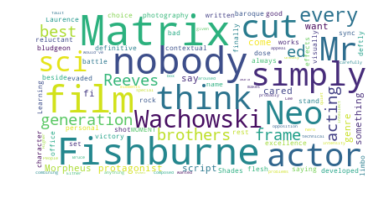

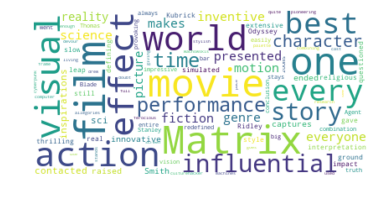

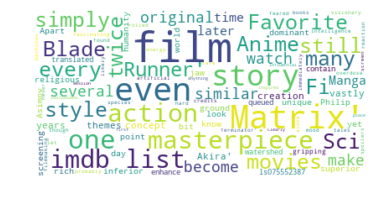

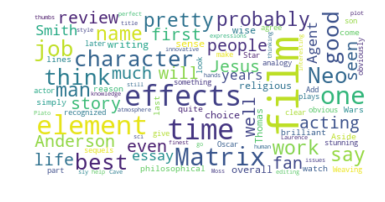

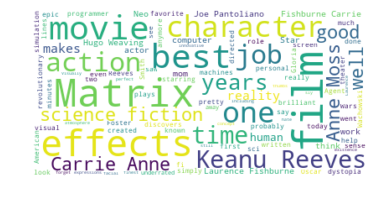

...

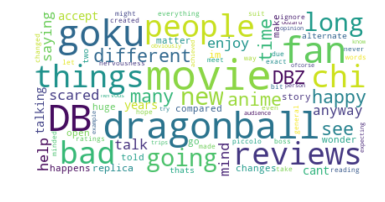

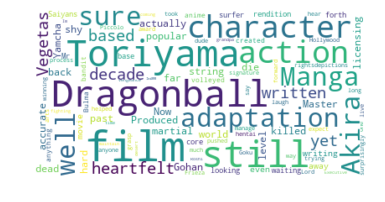

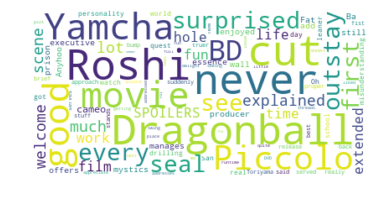

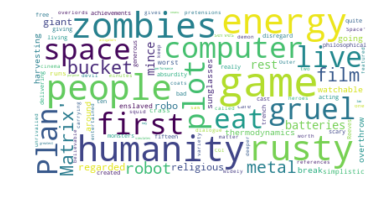

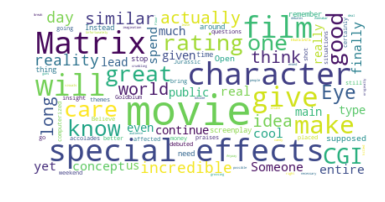

In [49]:
for i in range(100):
    wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(reviews[i])
    plt.figure()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()